# **Veri Yükleme**

In [ ]:
# Import necessary packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
import seaborn as sns
sns.set()

In [ ]:
# Görselleştirme ayarları
%matplotlib inline
sns.set(style='whitegrid')

In [ ]:
# GitHub deposunu klonlayalım
!git clone https://github.com/hardik0/AI-for-Medicine-Specialization
%cd AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/

Cloning into 'AI-for-Medicine-Specialization'...
remote: Enumerating objects: 1601, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (28/28), done.
remote: Total 1601 (delta 9), reused 2 (delta 0), pack-reused 1573 (from 1)
Receiving objects: 100% (1601/1601), 720.36 MiB | 28.87 MiB/s, done.
Resolving deltas: 100% (30/30), done.
Updating files: 100% (1497/1497), done.
/content/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis


In [ ]:
# İndirilen klasör içeriğini listeleyelim
%ls nih/

densenet.hdf5  images_small/  pretrained_model.h5  test.csv  train-small.csv  valid-small.csv


In [ ]:
# Veri setini yükleyelim
train_df = pd.read_csv("nih/train-small.csv")

# Veri setinin boyutlarını yazdır
print(f"Veri çerçevesi {train_df.shape[0]} satır ve {train_df.shape[1]} sütun içeriyor.")

# İlk 5 satırı görüntüleyelim
train_df.head()

Veri çerçevesi 1000 satır ve 16 sütun içeriyor.


,Image,Atelectasis,Cardiomegaly,Consolidation,Edema,Effusion,Emphysema,Fibrosis,Hernia,Infiltration,Mass,Nodule,PatientId,Pleural_Thickening,Pneumonia,Pneumothorax
0,00008270_015.png,0,0,0,0,0,0,0,0,0,0,0,8270,0,0,0
1,00029855_001.png,1,0,0,0,1,0,0,0,1,0,0,29855,0,0,0
2,00001297_000.png,0,0,0,0,0,0,0,0,0,0,0,1297,1,0,0
3,00012359_002.png,0,0,0,0,0,0,0,0,0,0,0,12359,0,0,0
4,00017951_001.png,0,0,0,0,0,0,0,0,1,0,0,17951,0,0,0


In [ ]:
# Sütunlardaki veri türlerini ve eksik değerleri kontrol edelim
train_df.info()

# Eksik değerlerin sayısını gösterelim
print("\nEksik değer sayısı:\n", train_df.isnull().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Image               1000 non-null   object
 1   Atelectasis         1000 non-null   int64 
 2   Cardiomegaly        1000 non-null   int64 
 3   Consolidation       1000 non-null   int64 
 4   Edema               1000 non-null   int64 
 5   Effusion            1000 non-null   int64 
 6   Emphysema           1000 non-null   int64 
 7   Fibrosis            1000 non-null   int64 
 8   Hernia              1000 non-null   int64 
 9   Infiltration        1000 non-null   int64 
 10  Mass                1000 non-null   int64 
 11  Nodule              1000 non-null   int64 
 12  PatientId           1000 non-null   int64 
 13  Pleural_Thickening  1000 non-null   int64 
 14  Pneumonia           1000 non-null   int64 
 15  Pneumothorax        1000 non-null   int64 
dtypes: int64(15), object(1)
m

In [ ]:
# Toplam PatientId sayısını ve benzersiz PatientId sayısını kontrol edelim
total_patient_ids = train_df['PatientId'].count()
unique_patient_ids = train_df['PatientId'].nunique()
print(f"Toplam hasta sayısı: {total_patient_ids}, bunlardan benzersiz hasta sayısı: {unique_patient_ids}")

# Her hastanın birden fazla görüntüsü olup olmadığını kontrol edelim
patient_image_counts = train_df['PatientId'].value_counts()
multiple_images_patients = (patient_image_counts > 1).sum()
print(f"Birden fazla görüntüsü olan hasta sayısı: {multiple_images_patients}")

Toplam hasta sayısı: 1000, bunlardan benzersiz hasta sayısı: 928
Birden fazla görüntüsü olan hasta sayısı: 59


In [ ]:
#Sütunların Listesini Al

columns = train_df.keys()
columns = list(columns)
print(columns)

['Image', 'Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema', 'Effusion', 'Emphysema', 'Fibrosis', 'Hernia', 'Infiltration', 'Mass', 'Nodule', 'PatientId', 'Pleural_Thickening', 'Pneumonia', 'Pneumothorax']


In [ ]:
# Gereksiz sütunları kaldır
columns.remove('Image') # Görüntü dosya adı sütunu
columns.remove('PatientId')  # Hasta kimliği sütunu

In [ ]:
# Etiket sütunlarının sayısını ve isimlerini yazdıralım
print(f"Bu veri setinde toplam {len(columns)} adet hastalık etiketi sütunu bulunmaktadır: {columns}")

Bu veri setinde toplam 14 adet hastalık etiketi sütunu bulunmaktadır: ['Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema', 'Effusion', 'Emphysema', 'Fibrosis', 'Hernia', 'Infiltration', 'Mass', 'Nodule', 'Pleural_Thickening', 'Pneumonia', 'Pneumothorax']


In [ ]:
# Her bir hastalığın pozitif örnek sayısını hesaplayalım ve yazdıralım
for column in columns:
    positive_samples = train_df[column].sum()
    print(f"{column} sınıfında {positive_samples} adet örnek bulunmaktadır")

Atelectasis sınıfında 106 adet örnek bulunmaktadır
Cardiomegaly sınıfında 20 adet örnek bulunmaktadır
Consolidation sınıfında 33 adet örnek bulunmaktadır
Edema sınıfında 16 adet örnek bulunmaktadır
Effusion sınıfında 128 adet örnek bulunmaktadır
Emphysema sınıfında 13 adet örnek bulunmaktadır
Fibrosis sınıfında 14 adet örnek bulunmaktadır
Hernia sınıfında 2 adet örnek bulunmaktadır
Infiltration sınıfında 175 adet örnek bulunmaktadır
Mass sınıfında 45 adet örnek bulunmaktadır
Nodule sınıfında 54 adet örnek bulunmaktadır
Pleural_Thickening sınıfında 21 adet örnek bulunmaktadır
Pneumonia sınıfında 10 adet örnek bulunmaktadır
Pneumothorax sınıfında 38 adet örnek bulunmaktadır


# **Görüntü Yükleme ve Görselleştirme**

**img_dir:** Görsellerin bulunduğu dizinin yolunu belirtir.

**images:** DataFrame'den Image sütununu numpy array olarak alır.

**random_images:** Rastgele 9 görüntü seçer.

**plt.imshow():** Görüntüleri yan yana görselleştirir.

Rastgele Seçilen 9 Görüntüyü Görüntüleme


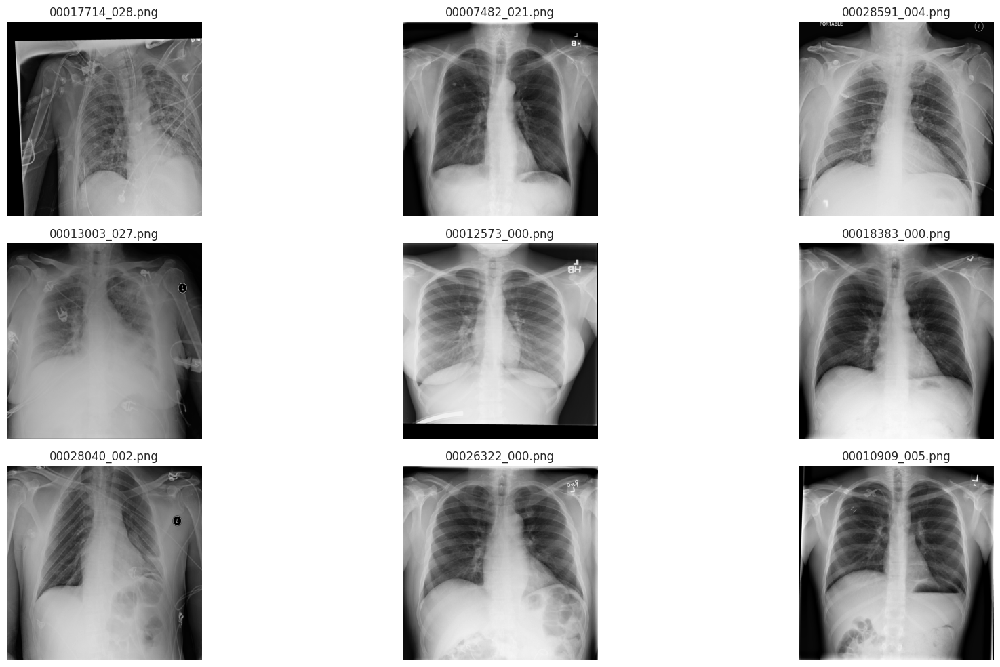

In [ ]:
# Görsellerin bulunduğu dizin
img_dir = 'nih/images_small/'

# Veri çerçevesindeki Image sütunundan numpy array olarak görüntü adlarını alalım
images = train_df['Image'].values

# Rastgele 9 görüntü seçelim
random_images = [np.random.choice(images) for _ in range(9)]

# Rastgele seçilen görüntüleri görselleştirelim
print('Rastgele Seçilen 9 Görüntüyü Görüntüleme')
plt.figure(figsize=(20, 10))

for i in range(9):
    plt.subplot(3, 3, i + 1)
    img = plt.imread(os.path.join(img_dir, random_images[i]))
    plt.imshow(img, cmap='gray')
    plt.title(random_images[i])
    plt.axis('off')

plt.tight_layout()
plt.show()

**plt.colorbar():** Görüntünün yanında renk skalasını gösterir, bu sayede piksel yoğunlukları hakkında daha fazla bilgi verir.
**plt.title(): **Her bir görüntünün başlığı olarak görüntü adını ekler.
**plt.axis('off'):** Görüntü etrafındaki eksen çizgilerini kaldırır.


Görüntü: 00017714_028.png
  - Maksimum piksel değeri: 1.0
  - Minimum piksel değeri: 0.0
  - Ortalama piksel değeri: 0.3802
  - Standart sapma: 0.2380
------------------------------
Görüntü: 00007482_021.png
  - Maksimum piksel değeri: 1.0
  - Minimum piksel değeri: 0.0
  - Ortalama piksel değeri: 0.4441
  - Standart sapma: 0.2649
------------------------------
Görüntü: 00028591_004.png
  - Maksimum piksel değeri: 1.0
  - Minimum piksel değeri: 0.0
  - Ortalama piksel değeri: 0.5525
  - Standart sapma: 0.2402
------------------------------
Görüntü: 00013003_027.png
  - Maksimum piksel değeri: 1.0
  - Minimum piksel değeri: 0.0
  - Ortalama piksel değeri: 0.4476
  - Standart sapma: 0.2130
------------------------------
Görüntü: 00012573_000.png
  - Maksimum piksel değeri: 1.0
  - Minimum piksel değeri: 0.0
  - Ortalama piksel değeri: 0.5425
  - Standart sapma: 0.2850
------------------------------
Görüntü: 00018383_000.png
  - Maksimum piksel değeri: 0.95686274766922
  - Minimum piksel 

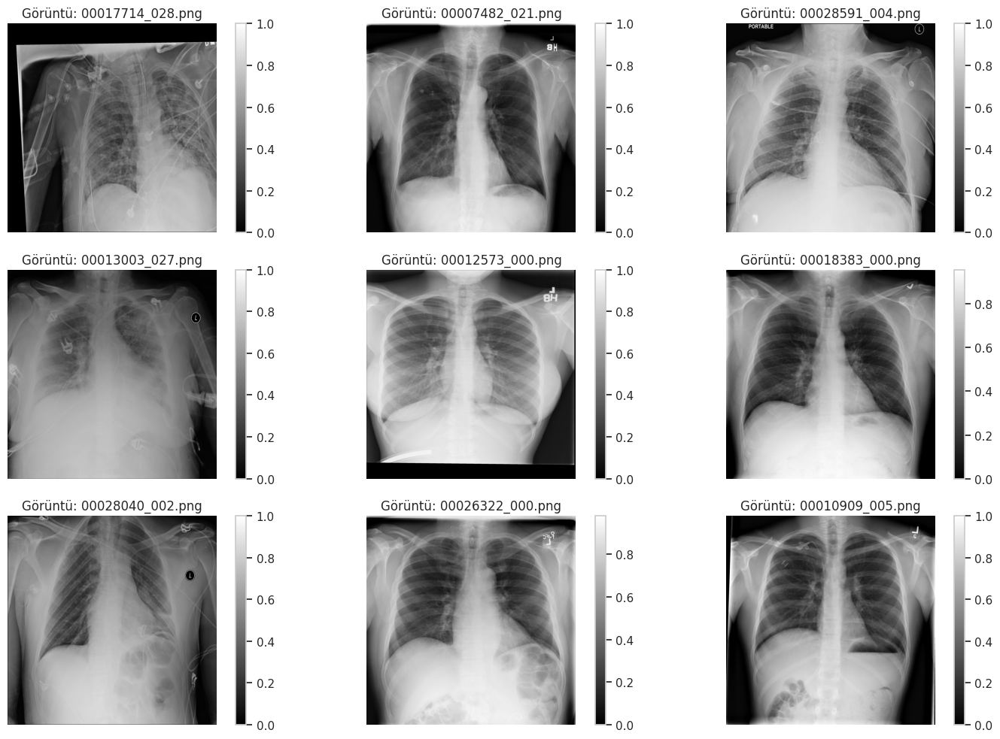

In [ ]:
# Rastgele seçilen görüntülerin istatistiksel özelliklerini hesaplayarak görselleştirelim
plt.figure(figsize=(15, 10))

for i, img_name in enumerate(random_images):
    img_path = os.path.join(img_dir, img_name)
    img = plt.imread(img_path)

    # Görüntüyü çizdir
    plt.subplot(3, 3, i + 1)
    plt.imshow(img, cmap='gray')
    plt.colorbar()  # Görüntü için colorbar ekleyelim
    plt.title(f'Görüntü: {img_name}')
    plt.axis('off')

    # Görüntünün istatistiksel özelliklerini yazdır
    print(f"Görüntü: {img_name}")
    print(f"  - Maksimum piksel değeri: {img.max()}")
    print(f"  - Minimum piksel değeri: {img.min()}")
    print(f"  - Ortalama piksel değeri: {img.mean():.4f}")
    print(f"  - Standart sapma: {img.std():.4f}")
    print("-" * 30)

plt.tight_layout()
plt.show()

**Histogram Çizimi**

Bu adımda, seçilen 9 görüntünün her biri için piksel yoğunluk dağılımını gösteren histogramlar çizeceğiz.

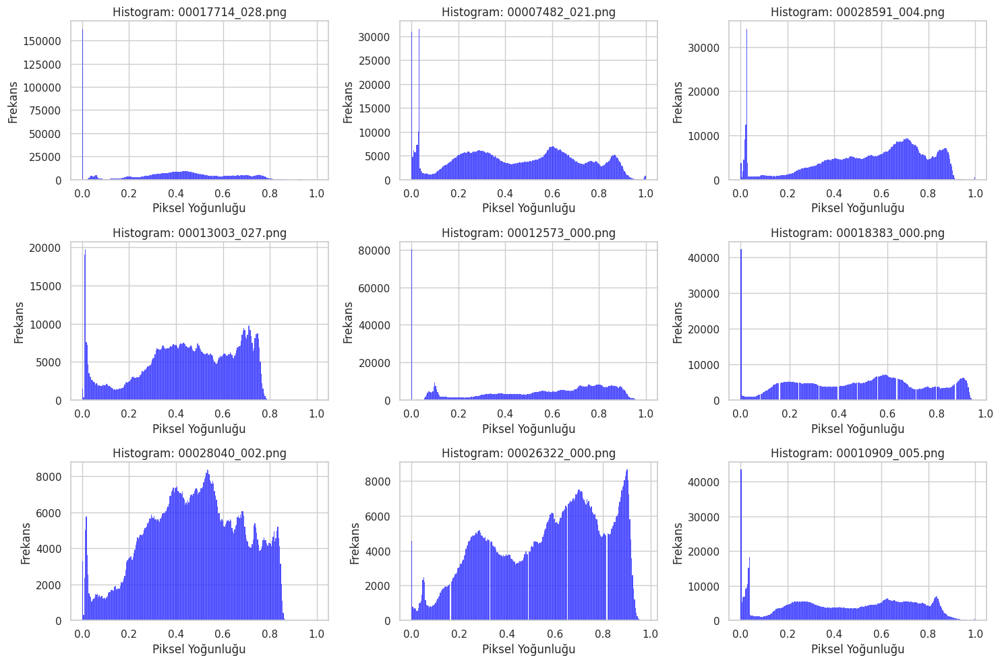

In [ ]:
# Seçilen 9 görüntü için histogramları çizelim
plt.figure(figsize=(15, 10))

for i, img_name in enumerate(random_images):
    img_path = os.path.join(img_dir, img_name)
    img = plt.imread(img_path)

    plt.subplot(3, 3, i + 1)
    sns.histplot(img.ravel(), bins=256, kde=False, color='blue')
    plt.title(f'Histogram: {img_name}')
    plt.xlabel('Piksel Yoğunluğu')
    plt.ylabel('Frekans')

plt.tight_layout()
plt.show()

Threshold Değeri ve Eşik Belirleme:

Histogramda x ekseni, piksel yoğunluklarını (0-255 arası veya normalize edilmişse 0-1 arası) gösterir.

Sol taraftaki yoğunluklar (0'a yakın olanlar), görüntünün karanlık (dark) bölgelerini temsil eder.

Sağ taraftaki yoğunluklar (1'e yakın olanlar), görüntünün parlak (bright) bölgelerini temsil eder.

Eğer histogramın büyük bir kısmı 0'a yakınsa, görüntü karanlık olabilir.

Eğer histogramın büyük bir kısmı 1'e yakınsa, görüntü parlak olabilir.

Eşit dağılıma sahip histogramlar, iyi kontrastlı ve dengeli bir görüntüyü temsil eder.

**Görüntülerin İncelenmesi:**

**Görüntü 00017714_028.png:**

Histogramda çoğunlukla 0'a yakın piksel değerleri bulunuyor.
Bu, görüntünün büyük ölçüde karanlık (dark) olduğunu gösterir.
Threshold değeri olarak 0.2'nin altı dark threshold kabul edilebilir.

**Görüntü 00007482_021.png:**

Histogramda geniş bir dağılım mevcut, ancak yine de sola doğru yoğunlaşma var.
Görüntü hafif karanlık (dark) olabilir ancak çok aşırı değil. Kontrast iyileştirilirse daha net hale getirilebilir.
Threshold değeri olarak 0.3'ün altı karanlık bölgeleri temsil edebilir.

**Görüntü 00028591_004.png:**

Histogramın çoğu orta aralıkta ve sağa doğru yayılmış. Bu, daha dengeli ve iyi kontrastlı bir görüntüyü işaret ediyor.
Bu görüntü normal ve iyi ışıklandırılmış bir görüntü olarak kabul edilebilir.

**Görüntü 00013003_027.png:**

Histogramın çoğunluğu orta ve sağ bölgede yoğunlaşmış, ancak düşük piksel yoğunlukları da var.
Görüntü, genel olarak dengeli ancak biraz daha parlak olabilir. Threshold değeri 0.6'nın üzerinde.

**Görüntü 00012573_000.png:**

Histogramın büyük bir kısmı sola doğru yoğunlaşmış, bu da görüntünün karanlık olduğunu gösteriyor.
Threshold değeri olarak 0.2'nin altı karanlık bölgeleri temsil edebilir.

**Görüntü 00018383_000.png:**

Histogram, geniş bir dağılıma sahip ve orta yoğunluklarda yoğunlaşıyor.
Bu, iyi kontrastlı ve dengeli bir görüntü olarak değerlendirilebilir.
Görüntü, iyi ışıklandırılmış ve normal olarak kabul edilebilir.

**Görüntü: 00028040_002.png**

Histogram, geniş bir aralıkta yoğunlaşmış ancak daha çok orta yoğunlukta piksel değerleri var.
Görüntü genel olarak iyi dengelenmiş görünüyor, ancak hafif kontrast iyileştirmesiyle daha net hale getirilebilir.
Threshold değeri olarak 0.3'ün altında kalan pikseller karanlık bölgeleri temsil ediyor olabilir.

**Görüntü: 00026322_000.png**

Histogram, geniş bir aralıkta yoğunlaşmış ve hem düşük hem de yüksek yoğunlukta piksel değerlerine sahip.
Görüntü dengeli ve iyi kontrastlı olarak değerlendirilebilir.
Parlaklık ve karanlık alanlar arasında iyi bir denge var. Histogram eşitleme işlemi gerekmez, ancak hafif bir kontrast ayarı yapılabilir.

**Görüntü: 00010909_005.png**

Histogramın büyük bir kısmı sola doğru yoğunlaşmış ve bazı bölgelerde çok yoğun piksel değerleri var.
Bu durum, görüntünün büyük ölçüde karanlık (dark) olduğunu gösteriyor.
Threshold değeri 0.2'nin altında kalan bölgeler karanlık olarak değerlendirilebilir.
Bu görüntü için kontrast germe (stretching) ve histogram eşitleme kullanılarak iyileştirme yapılabilir.




**Genel Sonuçlar**

Dengeli ve iyi kontrastlı görüntüler (örneğin 00026322_000.png), analiz ve modelleme için uygundur.

Karanlık görüntüler (örneğin 00010909_005.png), görüntü işleme teknikleriyle iyileştirilmelidir.

# **Görüntü İşleme ve İyileştirme**

In [ ]:
pip install numpy

In [ ]:
from skimage import exposure

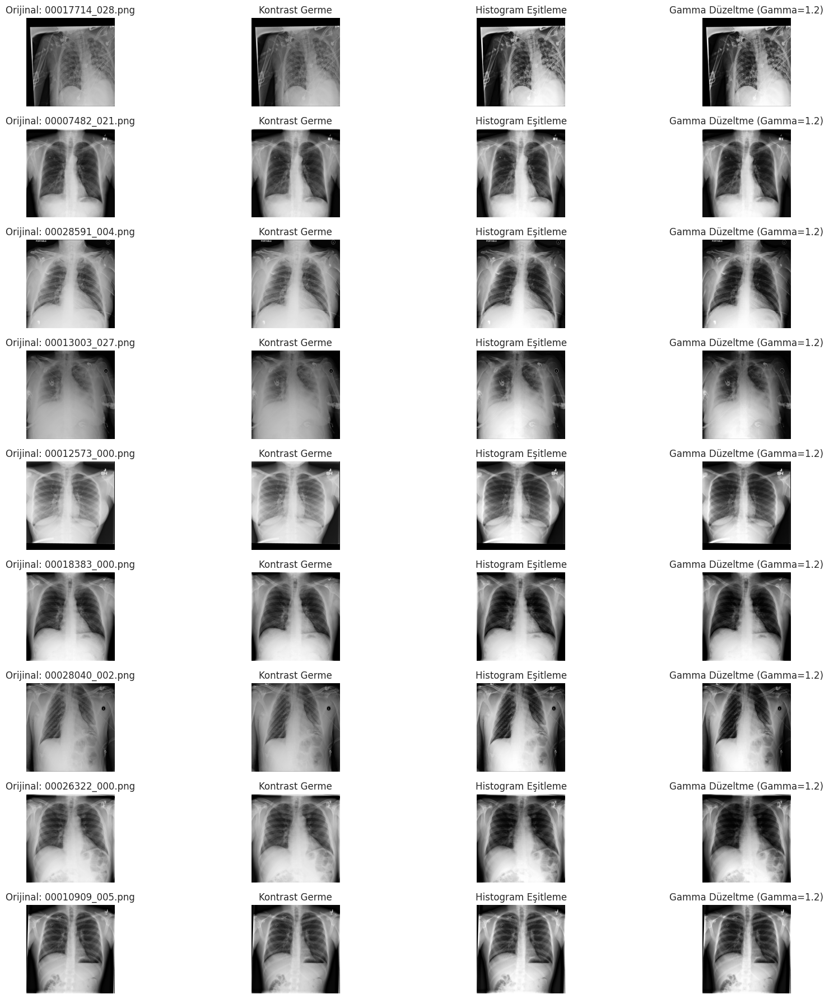

In [ ]:
# Görsellerin bulunduğu dizin (daha önce tanımladığımız img_dir ve random_images listesi kullanılıyor)
img_dir = 'nih/images_small/'

# Seçtiğimiz rastgele 9 görüntü üzerinde işlemler yapalım
plt.figure(figsize=(18, 18))

for idx, img_name in enumerate(random_images):
    # Orijinal görüntüyü yükle
    img_path = os.path.join(img_dir, img_name)
    raw_image = plt.imread(img_path)

    # Kontrast Germe İşlemi
    min_val, max_val = raw_image.min(), raw_image.max()
    contrast_stretched = (raw_image - min_val) / (max_val - min_val)
    contrast_stretched = (contrast_stretched * 255).astype(np.uint8)

    # Histogram Eşitleme İşlemi
    equalized_image = exposure.equalize_hist(contrast_stretched)
    equalized_image = (equalized_image * 255).astype(np.uint8)

    # Gamma Düzeltme İşlemi
    gamma = 1.2
    gamma_corrected = np.power(equalized_image / 255.0, gamma) * 255
    gamma_corrected = gamma_corrected.astype(np.uint8)

    # Görüntüleri ve histogramlarını görselleştirelim
    plt.subplot(9, 4, idx * 4 + 1)
    plt.imshow(raw_image, cmap='gray')
    plt.title(f'Orijinal: {img_name}')
    plt.axis('off')

    plt.subplot(9, 4, idx * 4 + 2)
    plt.imshow(contrast_stretched, cmap='gray')
    plt.title('Kontrast Germe')
    plt.axis('off')

    plt.subplot(9, 4, idx * 4 + 3)
    plt.imshow(equalized_image, cmap='gray')
    plt.title('Histogram Eşitleme')
    plt.axis('off')

    plt.subplot(9, 4, idx * 4 + 4)
    plt.imshow(gamma_corrected, cmap='gray')
    plt.title(f'Gamma Düzeltme (Gamma={gamma})')
    plt.axis('off')

plt.tight_layout()
plt.show()

**Orijinal Görüntü:** İlk sütun, her bir görüntünün orijinal halini gösteriyor.

**Kontrast Germe:** İkinci sütun, kontrast gerilmiş görüntüyü gösteriyor.

**Histogram Eşitleme:** Üçüncü sütun, histogram eşitleme sonrası iyileştirilmiş görüntüyü gösteriyor.

**Gamma Düzeltme:** Dördüncü sütun, gamma düzeltme uygulandıktan sonraki görüntüyü gösteriyor.

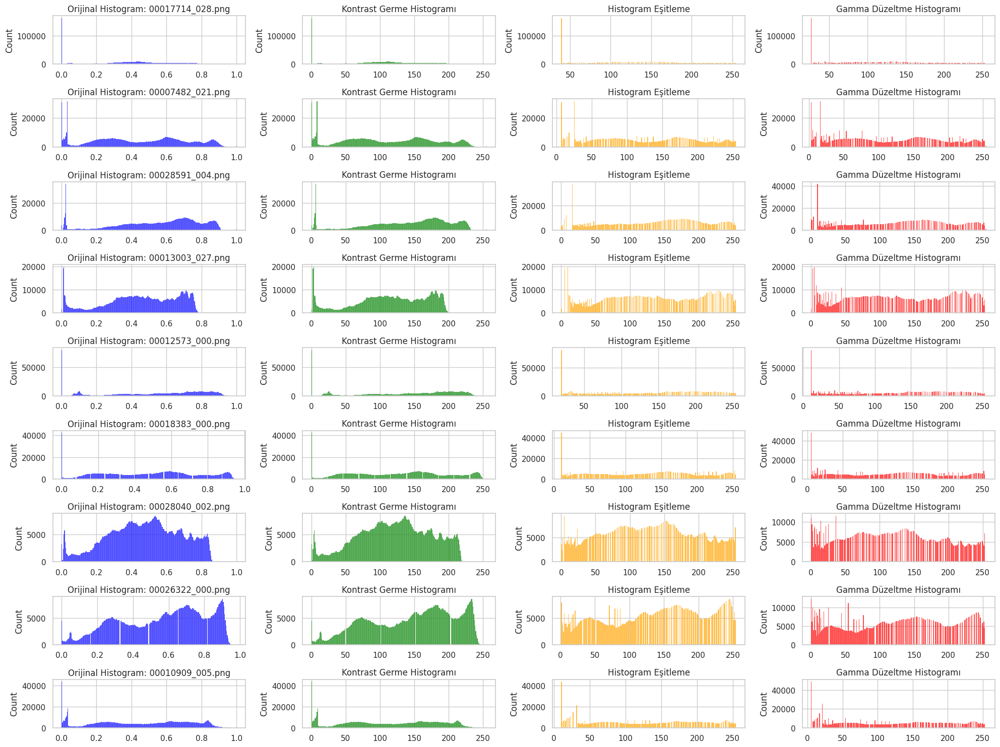

In [ ]:
# Her bir işlem sonrası histogramları çizelim
plt.figure(figsize=(20, 15))

for idx, img_name in enumerate(random_images):
    img_path = os.path.join(img_dir, img_name)
    raw_image = plt.imread(img_path)

    # İşlemler
    min_val, max_val = raw_image.min(), raw_image.max()
    contrast_stretched = (raw_image - min_val) / (max_val - min_val)
    contrast_stretched = (contrast_stretched * 255).astype(np.uint8)
    equalized_image = exposure.equalize_hist(contrast_stretched)
    equalized_image = (equalized_image * 255).astype(np.uint8)
    gamma = 1.2
    gamma_corrected = np.power(equalized_image / 255.0, gamma) * 255
    gamma_corrected = gamma_corrected.astype(np.uint8)

    # Orijinal histogram
    plt.subplot(9, 4, idx * 4 + 1)
    sns.histplot(raw_image.ravel(), bins=256, kde=False, color='blue')
    plt.title(f'Orijinal Histogram: {img_name}')

    # Kontrast germe histogramı
    plt.subplot(9, 4, idx * 4 + 2)
    sns.histplot(contrast_stretched.ravel(), bins=256, kde=False, color='green')
    plt.title('Kontrast Germe Histogramı')

    # Histogram eşitleme histogramı
    plt.subplot(9, 4, idx * 4 + 3)
    sns.histplot(equalized_image.ravel(), bins=256, kde=False, color='orange')
    plt.title('Histogram Eşitleme')

    # Gamma düzeltme histogramı
    plt.subplot(9, 4, idx * 4 + 4)
    sns.histplot(gamma_corrected.ravel(), bins=256, kde=False, color='red')
    plt.title('Gamma Düzeltme Histogramı')

plt.tight_layout()
plt.show()

**Görüntü: 00017714_028.png**

***Orijinal:*** Aşırı karanlık bir görüntü, kontrast çok düşük.

***Kontrast Germe:*** Görüntüde hafif iyileşme var ancak hala sol tarafa yığılma var.

***Histogram Eşitleme:*** Kontrastı artırarak detayların bir kısmını açığa çıkardı.

***Gamma Düzeltme:***
Parlaklığı artırarak daha dengeli bir görüntü sağladı, ancak bazı karanlık alanlar hala mevcut.


**Görüntü: 00007482_021.png**

***Orijinal:*** Hafif karanlık, kontrast biraz düşük.

***Kontrast Germe:*** Piksel dağılımını genişletti, görüntü daha net oldu.

***Histogram Eşitleme:*** Görüntü detayları daha belirgin hale geldi.

***Gamma Düzeltme:*** Görüntünün parlaklığını artırarak genel iyileştirme sağladı.


**Görüntü: 00028591_004.png**

***Orijinal:*** Orta kontrastlı, ancak hala karanlık bölgeler mevcut.

***Kontrast Germe:*** Görüntüdeki karanlık alanları açarak kontrastı artırdı.

***Histogram Eşitleme:*** Daha dengeli bir görüntü elde edildi.

***Gamma Düzeltme:*** Görüntüdeki detayları daha net hale getirdi.


**Görüntü: 00013003_027.png**

***Orijinal:*** Orta kontrastlı ancak biraz koyu alanlar var.

***Kontrast Germe:*** Görüntüde hafif bir iyileşme sağladı.

***Histogram Eşitleme:*** Kontrastı artırarak daha net hale getirdi.

***Gamma Düzeltme:*** Görüntünün parlaklığını hafifçe artırarak daha iyi hale getirdi.

**Görüntü: 00012573_000.png**
***Orijinal:***Çok karanlık ve kontrastı düşük.

***Kontrast Germe:*** Görüntüdeki karanlık alanları iyileştirdi.

***Histogram Eşitleme:*** Görüntü daha eşit aydınlatıldı, detaylar daha belirgin hale geldi.

***Gamma Düzeltme:*** Parlaklığı artırarak daha dengeli bir görünüm sağladı.

**Görüntü: 00018383_000.png**

***Orijinal:*** Karanlık, ancak kontrast orta seviyede.

***Kontrast Germe:*** Görüntüyü biraz daha parlak hale getirdi.

***Histogram Eşitleme:*** Kontrastı artırarak görüntünün daha net olmasını sağladı.

***Gamma Düzeltme:*** Parlaklık ve kontrast açısından en iyi sonucu verdi.

**Görüntü: 00028040_002.png**

***Orijinal:*** Orta kontrastlı, ancak bazı karanlık alanlar mevcut.

***Kontrast Germe:*** Görüntüde kontrastı artırdı.

***Histogram Eşitleme:*** Kontrast ve parlaklık açısından iyileştirdi, ancak hafif aşırı parlaklık görülebilir.

***Gamma Düzeltme:*** Görüntü parlaklığı optimize edilerek daha iyi hale geldi.

**Görüntü: 00026322_000.png**

***Orijinal:*** Dengeli bir görüntü, kontrast oldukça iyi.

***Kontrast Germe:*** Görüntü zaten iyi kontrastlı olduğu için çok büyük bir değişiklik yapmadı.

***Histogram Eşitleme:*** Detayları hafifçe iyileştirdi.

***Gamma Düzeltme:*** Gerekli değildi, ancak biraz daha parlak hale getirdi.

**Görüntü: 00010909_005.png**

***Orijinal:*** Karanlık bir görüntü, kontrast düşük.

***Kontrast Germe:*** Görüntüde önemli bir iyileşme sağladı.

***Histogram Eşitleme:*** Kontrastı artırarak detayları ortaya çıkardı.

***Gamma Düzeltme:*** Parlaklığı artırarak daha dengeli bir görüntü elde edildi.


# **Median ve Gaussian Blur Uygulaması**

In [ ]:
import cv2  # opencv for python package

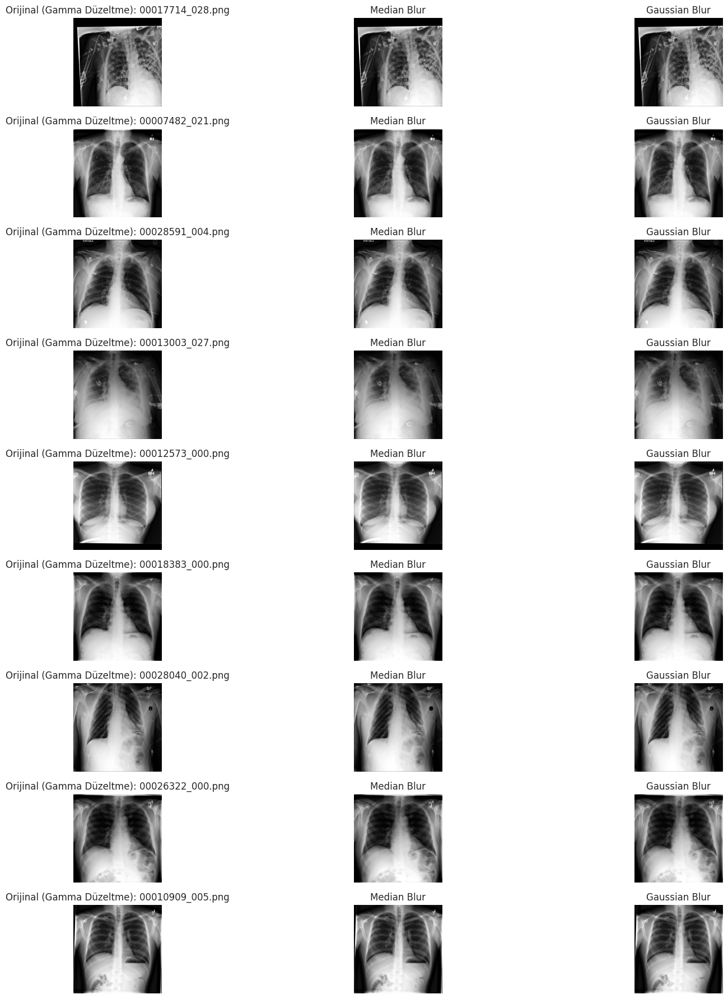

In [ ]:
# Gürültü azaltma işlemleri için seçtiğimiz rastgele 9 görüntü üzerinde işlemler yapalım
plt.figure(figsize=(18, 18))

for idx, img_name in enumerate(random_images):
    # Görüntü yolunu al ve yükle
    img_path = os.path.join(img_dir, img_name)
    raw_image = plt.imread(img_path)

    # Kontrast, Histogram Eşitleme ve Gamma Düzeltme işlemlerini tekrar yapalım
    min_val, max_val = raw_image.min(), raw_image.max()
    contrast_stretched = (raw_image - min_val) / (max_val - min_val)
    contrast_stretched = (contrast_stretched * 255).astype(np.uint8)
    equalized_image = exposure.equalize_hist(contrast_stretched)
    equalized_image = (equalized_image * 255).astype(np.uint8)
    gamma_corrected = np.power(equalized_image / 255.0, 1.2) * 255
    gamma_corrected = gamma_corrected.astype(np.uint8)

    # Median Blur ve Gaussian Blur uygulayalım
    median_filtered = cv2.medianBlur(gamma_corrected, 5)
    gaussian_filtered = cv2.GaussianBlur(gamma_corrected, (5, 5), 0)

    # Sonuçları görselleştirelim
    plt.subplot(9, 3, idx * 3 + 1)
    plt.imshow(gamma_corrected, cmap='gray')
    plt.title(f'Orijinal (Gamma Düzeltme): {img_name}')
    plt.axis('off')

    plt.subplot(9, 3, idx * 3 + 2)
    plt.imshow(median_filtered, cmap='gray')
    plt.title('Median Blur')
    plt.axis('off')

    plt.subplot(9, 3, idx * 3 + 3)
    plt.imshow(gaussian_filtered, cmap='gray')
    plt.title('Gaussian Blur')
    plt.axis('off')

plt.tight_layout()
plt.show()

**Median Blur Yöntemi:**

**Özellikleri:**

Median Blur, özellikle tuz ve biber (salt & pepper) türü gürültüyü ortadan kaldırmak için etkilidir.
Kenar detaylarını koruyarak gürültüyü azaltır, bu nedenle tıbbi görüntüler gibi ince detayların önemli olduğu durumlarda tercih edilir.
Sonuçlar:

Görüntülerdeki keskin detaylar korunmuş, gürültü azaltılmış ancak bulanıklık oranı daha az.
Özellikle **00010909_005.png** gibi karanlık ve kontrastı düşük görüntülerde gürültü azaltma etkisi net bir şekilde görüldü.
Ancak bazı görüntülerde **(00026322_000.png gibi)** Median Blur çok belirgin bir değişiklik yapmadı, çünkü zaten düşük gürültü seviyesine sahipti.

**Gaussian Blur Yöntemi:**

**Özellikleri:**

Gaussian Blur, genel pürüzsüzleştirme ve gürültü azaltma amacıyla kullanılır.
Ancak, kenar detaylarını biraz bulanıklaştırabilir, bu nedenle keskinlik gerektiren durumlarda dikkatli kullanılmalıdır.

**Sonuçlar:**

Gaussian Blur, görüntüleri daha pürüzsüz hale getirdi, ancak bazı ince detayların kaybolmasına neden oldu.
**00028040_002.png** gibi daha parlak görüntülerde, Gaussian Blur genel bir yumuşatma sağlayarak gürültüyü azalttı, ancak görüntünün keskinliğini biraz kaybettirdi.
Daha önce yüksek kontrastlı olan görüntülerde **(00017714_028.png gibi)** Gaussian Blur uygulandığında, kenar detaylarının bir kısmı kayboldu, ancak genel pürüzsüzlük arttı.


In [ ]:
import random

# **Rastgele Döndürme ve Yatay Ayna Çevirme İşlemleri**

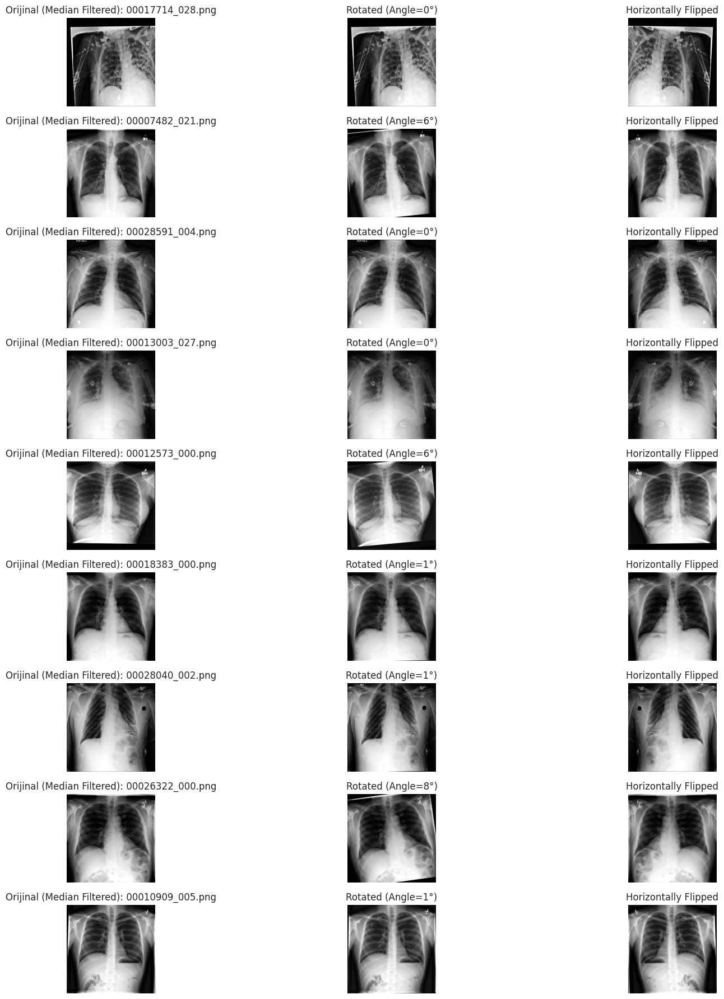

In [ ]:
# Gürültü azaltma işlemlerinden sonra elde edilen median filtreli görüntü üzerinde işlemler yapacağız
plt.figure(figsize=(18, 18))

for idx, img_name in enumerate(random_images):
    # Görüntü yolunu al ve yükle
    img_path = os.path.join(img_dir, img_name)
    raw_image = plt.imread(img_path)

    # Kontrast, Histogram Eşitleme ve Gamma Düzeltme işlemleri
    min_val, max_val = raw_image.min(), raw_image.max()
    contrast_stretched = (raw_image - min_val) / (max_val - min_val)
    contrast_stretched = (contrast_stretched * 255).astype(np.uint8)
    equalized_image = exposure.equalize_hist(contrast_stretched)
    equalized_image = (equalized_image * 255).astype(np.uint8)
    gamma_corrected = np.power(equalized_image / 255.0, 1.2) * 255
    gamma_corrected = gamma_corrected.astype(np.uint8)

    # Median Blur uygulandıktan sonra rastgele döndürme ve yatay çevirme işlemleri
    median_filtered = cv2.medianBlur(gamma_corrected, 5)

    # 1. Rastgele döndürme
    angle = random.randint(0, 10)  # Rastgele 0-10 derece arasında açı seçimi
    center = (median_filtered.shape[1] // 2, median_filtered.shape[0] // 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, scale=1.0)
    rotated_image = cv2.warpAffine(median_filtered, rotation_matrix, (median_filtered.shape[1], median_filtered.shape[0]))

    # 2. Yatay ayna çevirme
    flipped_horizontal = cv2.flip(median_filtered, 1)

    # Sonuçları görselleştirelim
    plt.subplot(9, 3, idx * 3 + 1)
    plt.imshow(median_filtered, cmap='gray')
    plt.title(f'Orijinal (Median Filtered): {img_name}')
    plt.axis('off')

    plt.subplot(9, 3, idx * 3 + 2)
    plt.imshow(rotated_image, cmap='gray')
    plt.title(f'Rotated (Angle={angle}°)')
    plt.axis('off')

    plt.subplot(9, 3, idx * 3 + 3)
    plt.imshow(flipped_horizontal, cmap='gray')
    plt.title('Horizontally Flipped')
    plt.axis('off')

plt.tight_layout()
plt.show()

**Döndürme (Rotation)**
Rastgele açılar (0° ile 10° arasında) kullanılarak yapılan rotasyon işlemleri, görüntülerde hafif döndürmeler yaparak farklı varyasyonlar elde etmemizi sağladı.

**Amaç:** Görüntü verisini çeşitlendirmek (data augmentation) ve makine öğrenmesi modellerine farklı perspektifler sunarak modelin genel performansını artırmak.

**Sonuçlar:**

**00012573_000.png** ve **00010909_005.png** gibi görüntülerde 1°-6° arasında küçük açılar kullanılmış ve görüntülerde büyük bir bozulma olmadan varyasyonlar elde edilmiştir.
**00026322_000.png** görüntüsü ise 8° döndürülmüş, bu biraz daha belirgin bir döndürme olup model eğitimi için geniş bir çeşitlilik sağladı.

**Yatay Ayna Çevirme (Horizontal Flipping)**

Yatay ayna çevirme işlemi, görüntüleri simetrik olarak yansıtmak için kullanıldı.

**Amaç:** Veri setine daha fazla çeşitlilik kazandırmak ve modeli, görüntülerdeki simetrik varyasyonlara karşı dayanıklı hale getirmek.

**Sonuçlar:**

Tüm görüntülerde yatay ayna çevirme işlemi başarılı bir şekilde uygulandı.
Bu çalışmada, modelin farklı varyasyonlara karşı dayanıklılığını artırmak için yararlı bir işlem olarak kullanıldı.

# **Fourier Dönüşümü ve Frekans Filtreleme**

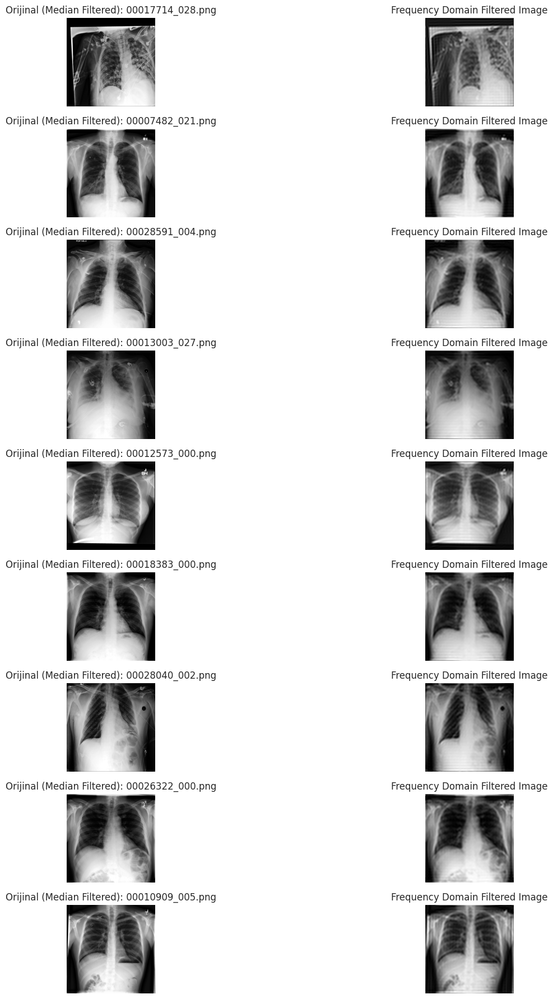

In [ ]:
# Gürültü azaltma işlemleri yapılmış 9 rastgele görüntü üzerinde frekans alanında filtreleme yapalım
plt.figure(figsize=(18, 18))

for idx, img_name in enumerate(random_images):
    # Görüntü yolunu al ve yükle
    img_path = os.path.join(img_dir, img_name)
    raw_image = plt.imread(img_path)

    # Görüntü işleme: Kontrast, Gamma Düzeltme ve Median Blur
    min_val, max_val = raw_image.min(), raw_image.max()
    contrast_stretched = (raw_image - min_val) / (max_val - min_val)
    contrast_stretched = (contrast_stretched * 255).astype(np.uint8)
    equalized_image = exposure.equalize_hist(contrast_stretched)
    equalized_image = (equalized_image * 255).astype(np.uint8)
    gamma_corrected = np.power(equalized_image / 255.0, 1.2) * 255
    gamma_corrected = gamma_corrected.astype(np.uint8)
    median_filtered = cv2.medianBlur(gamma_corrected, 5)

    # Fourier Dönüşümü ve filtreleme
    dft = cv2.dft(np.float32(median_filtered), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shifted = np.fft.fftshift(dft)

    # Frekans alanında düşük frekansları geçiren bir maske oluştur
    rows, cols = median_filtered.shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols, 2), np.uint8)
    mask[crow-30:crow+30, ccol-30:ccol+30] = 1

    # Maskeyi frekans alanına uygula ve ters Fourier dönüşümü yap
    fshift = dft_shifted * mask
    f_ishift = np.fft.ifftshift(fshift)
    filtered_image = cv2.idft(f_ishift)
    filtered_image = cv2.magnitude(filtered_image[:, :, 0], filtered_image[:, :, 1])

    # Filtrelenmiş görüntüyü normalize et
    filtered_image = cv2.normalize(filtered_image, None, 0, 255, cv2.NORM_MINMAX)
    filtered_image = filtered_image.astype(np.uint8)

    # Sonuçları görselleştirelim
    plt.subplot(9, 2, idx * 2 + 1)
    plt.imshow(median_filtered, cmap='gray')
    plt.title(f'Orijinal (Median Filtered): {img_name}')
    plt.axis('off')

    plt.subplot(9, 2, idx * 2 + 2)
    plt.imshow(filtered_image, cmap='gray')
    plt.title("Frequency Domain Filtered Image")
    plt.axis('off')

plt.tight_layout()
plt.show()

**Orijinal vs Frekans Alanında Filtrelenmiş Görüntüler**

Orijinal görüntülerde gürültü seviyeleri değişkenlik gösteriyordu. Örneğin:
**00017714_028.png** ve **00012573_000.png** gibi görüntülerde daha yüksek kontrast ve belirgin detaylar varken,
**00026322_000.png** ve **00010909_005.png** gibi görüntüler daha düşük kontrast ve belirginlik gösteriyordu.

**Frekans alanında filtreleme sonrası:**

Yüksek frekans bileşenleri filtrelendiği için, görüntüler daha yumuşak ve pürüzsüz hale geldi.
Detaylar biraz kaybolmuş olabilir, ancak genel yapı korunarak gürültü azaltılmış oldu.
Özellikle **00018383_000.png** ve **00028040_002.png** gibi görüntülerde, filtreleme sonrası daha temiz ve net bir görünüm elde edildi.

**Gürültü Azaltma ve Görüntü Netliği**

Düşük frekansları geçiren filtre kullanıldığında, görüntünün ana yapısı korunarak yüksek frekanslı gürültüler ortadan kaldırılır.
Ancak, ince detayların ön planda olduğu tıbbi görüntüler üzerinde bu tür filtreler kullanıldığında, hayati detayların kaybolma riski olabilir.
**00010909_005.png** gibi bazı görüntülerde, filtreleme sonrası daha pürüzsüz bir görünüm elde edilirken, **00017714_028.png** gibi görüntülerde bazı ince detaylar kaybolmuş olabilir.


# **Keskinleştirme ve Bicubic Enterpolasyon**

In [ ]:
from scipy.ndimage import zoom

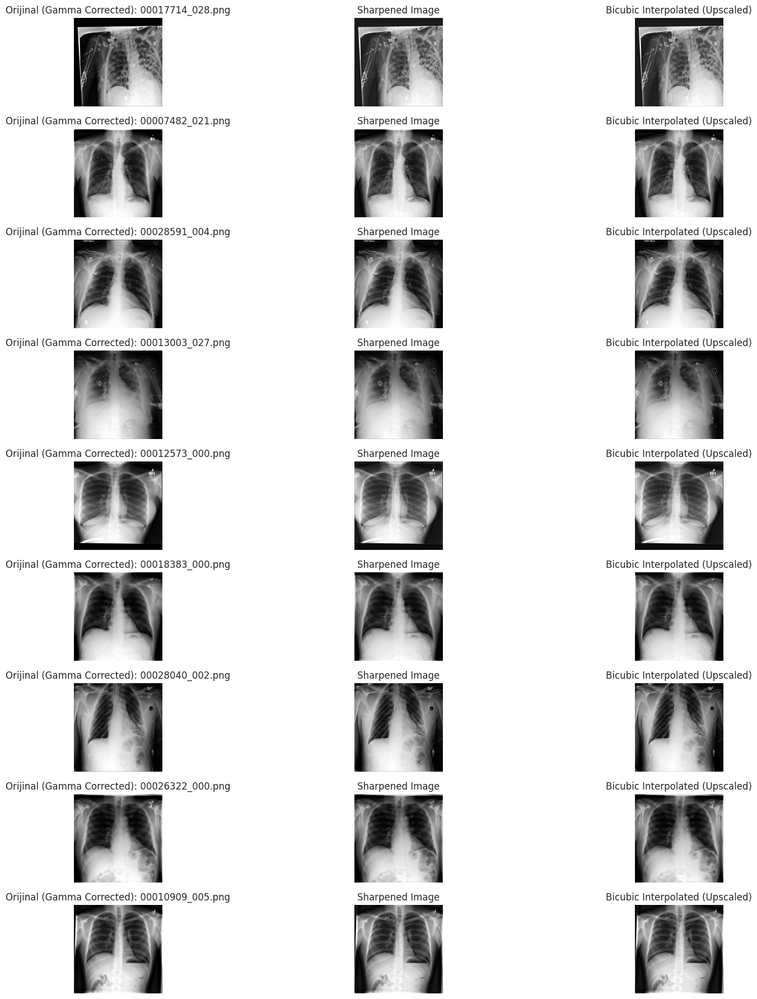

In [ ]:
# 9 görüntü üzerinde keskinleştirme ve bicubic enterpolasyon işlemleri yapalım
plt.figure(figsize=(18, 18))

for idx, img_name in enumerate(random_images):
    # Görüntü yolunu al ve yükle
    img_path = os.path.join(img_dir, img_name)
    raw_image = plt.imread(img_path)

    # Görüntü işleme: Kontrast, Gamma Düzeltme ve Median Blur
    min_val, max_val = raw_image.min(), raw_image.max()
    contrast_stretched = (raw_image - min_val) / (max_val - min_val)
    contrast_stretched = (contrast_stretched * 255).astype(np.uint8)
    equalized_image = exposure.equalize_hist(contrast_stretched)
    equalized_image = (equalized_image * 255).astype(np.uint8)
    gamma_corrected = np.power(equalized_image / 255.0, 1.2) * 255
    gamma_corrected = gamma_corrected.astype(np.uint8)

    # Adım 1: Keskinleştirme (Unsharp Masking)
    sharpening_kernel = np.array([[-1, -1, -1],
                                  [-1,  9, -1],
                                  [-1, -1, -1]])
    sharpened_image = np.clip(cv2.filter2D(gamma_corrected, -1, sharpening_kernel), 0, 255).astype(np.uint8)

    # Adım 2: Bicubic Enterpolasyon ile büyütme
    scale_factor = 2
    resized_image = zoom(sharpened_image, scale_factor, order=3)  # Bicubic enterpolasyon (order=3)

    # Sonuçları görselleştirelim
    plt.subplot(9, 3, idx * 3 + 1)
    plt.imshow(gamma_corrected, cmap='gray')
    plt.title(f'Orijinal (Gamma Corrected): {img_name}')
    plt.axis('off')

    plt.subplot(9, 3, idx * 3 + 2)
    plt.imshow(sharpened_image, cmap='gray')
    plt.title("Sharpened Image")
    plt.axis('off')

    plt.subplot(9, 3, idx * 3 + 3)
    plt.imshow(resized_image, cmap='gray')
    plt.title("Bicubic Interpolated (Upscaled)")
    plt.axis('off')

plt.tight_layout()
plt.show()

**Orijinal (Gamma Corrected) Görüntüler:**

İlk sütunda yer alan gamma düzeltmesi uygulanmış orijinal görüntüler, kontrastı artırarak görüntüdeki detayları öne çıkardı.
Gamma düzeltmesi, özellikle düşük kontrastlı röntgen görüntülerinde detayların daha belirgin hale gelmesini sağladı.

**Keskinleştirme (Sharpened Image) - Unsharp Masking Tekniği:**

Unsharp masking tekniği ile yapılan keskinleştirme, görüntülerin kenarlarını ve detaylarını daha belirgin hale getirdi.
**Avantajları:**

Görüntüdeki belirgin detaylar öne çıkarıldı, bu da tıbbi teşhis için önemli olabilir.
Özellikle bulanık bölgeler netleştirildi.

**Dezavantajları:**

Keskinleştirme bazı durumlarda gürültüyü artırabilir, bu nedenle tıbbi görüntülerde aşırı kullanımı dikkatli yapılmalıdır.
**00013003_027.png** gibi bazı görüntülerde, keskinleştirme sonrası kenar bölgelerde hafif gürültü artışı gözlemlenebilir.

**Bicubic Enterpolasyon (Büyütülmüş Görüntü):**

Bicubic enterpolasyon ile görüntüler iki kat büyütüldü.

**Amaç:** Görüntüleri büyüterek, özellikle küçük detayları daha iyi analiz edebilmek.

**Avantajları:**

Pürüzsüz geçişler sağlanarak, büyütme sonrası görüntü kalitesi korunmuş oldu.
Tıbbi görüntülerde, daha büyük çözünürlükle detayların daha iyi incelenmesine olanak tanır.

**Dezavantajları:**

Keskinlik artışı ve büyütme işlemi birlikte kullanıldığında, bazı görüntülerde hafif artefaktlar (yan etkiler) oluşabilir.
**00010909_005.png** gibi bazı görüntülerde, büyütme sonrası kenar bölgelerde keskinlik kaybı oluşmuş olabilir.

Cloning into 'AI-for-Medicine-Specialization'...
remote: Enumerating objects: 1601, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (28/28), done.
remote: Total 1601 (delta 9), reused 2 (delta 0), pack-reused 1573 (from 1)
Receiving objects: 100% (1601/1601), 720.36 MiB | 23.97 MiB/s, done.
Resolving deltas: 100% (30/30), done.
Updating files: 100% (1497/1497), done.
/content/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis
Seçilen rastgele görüntüler: ['00026322_000.png', '00018855_000.png', '00025234_008.png', '00029435_000.png', '00007439_003.png', '00010790_032.png', '00014146_003.png', '00014060_001.png', '00026208_000.png']


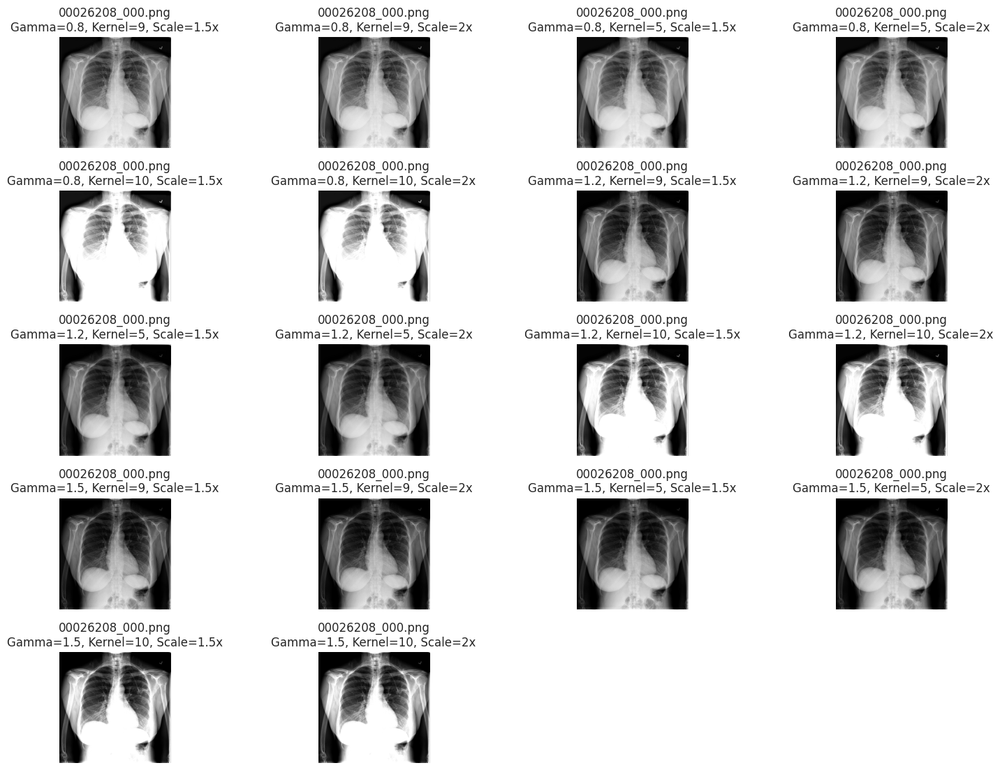

In [6]:
# Import necessary packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
import seaborn as sns
sns.set()

# GitHub deposunu klonlayalım
!git clone https://github.com/hardik0/AI-for-Medicine-Specialization
%cd AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/

# Veri çerçevesini tekrar yükleyin (CSV dosyanızın yolunu doğru girin)
train_df = pd.read_csv("nih/train-small.csv")


columns = train_df.keys()
columns = list(columns)

# Gereksiz sütunları kaldır
columns.remove('Image') # Görüntü dosya adı sütunu
columns.remove('PatientId')  # Hasta kimliği sütunu

# Görüntü dizininizin yolunu belirleyin
img_dir = 'nih/images_small/'

# Rastgele 9 görüntü seçin
images = train_df['Image'].values
random_images = [np.random.choice(images) for i in range(9)]

# Kontrol: Rastgele seçilen görüntüleri listeleyin
print("Seçilen rastgele görüntüler:", random_images)

# Hiperparametreler
gamma_values = [0.8, 1.2, 1.5]  # Farklı gamma düzeltme katsayıları
sharpening_kernels = [
    np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]]),
    np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]]),
    np.array([[-1, -1, -1], [-1, 10, -1], [-1, -1, -1]])
]
scale_factors = [1.5, 2]  # Büyütme ölçekleri (1.5x, 2x)

# Görselleştirme ayarları
plt.figure(figsize=(15, 20))

# 9 rastgele seçilmiş görüntü üzerinde deneme yapalım
for idx, img_name in enumerate(random_images):
    img_path = os.path.join(img_dir, img_name)
    raw_image = plt.imread(img_path)

    # Orijinal görüntüleri normalize edelim
    min_val, max_val = raw_image.min(), raw_image.max()
    raw_image = ((raw_image - min_val) / (max_val - min_val) * 255).astype(np.uint8)

    plot_idx = 1
    for gamma in gamma_values:
        # 1. Adım: Gamma düzeltme
        gamma_corrected = np.power(raw_image / 255.0, gamma) * 255
        gamma_corrected = gamma_corrected.astype(np.uint8)

        for kernel in sharpening_kernels:
            # 2. Adım: Keskinleştirme
            sharpened_image = np.clip(cv2.filter2D(gamma_corrected, -1, kernel), 0, 255).astype(np.uint8)

            for scale in scale_factors:
                # 3. Adım: Bicubic enterpolasyon ile büyütme
                resized_image = zoom(sharpened_image, scale, order=3)

                # Sonuçları görselleştirelim
                plt.subplot(9, 4, plot_idx)
                plt.imshow(resized_image, cmap='gray')
                plt.title(f"{img_name}\nGamma={gamma}, Kernel={kernel[1,1]}, Scale={scale}x")
                plt.axis('off')
                plot_idx += 1

plt.tight_layout()
plt.show()


In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
from scipy.ndimage import zoom
import os

# GitHub deposunu klonlayalım ve CSV dosyasını yükleyelim
!git clone https://github.com/hardik0/AI-for-Medicine-Specialization
%cd AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/
train_df = pd.read_csv("nih/train-small.csv")

# Görüntü dizininizin yolunu belirleyin
img_dir = 'nih/images_small/'

# Rastgele 6 görüntü seçelim
images = train_df['Image'].values

Cloning into 'AI-for-Medicine-Specialization'...
remote: Enumerating objects: 1601, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (28/28), done.
remote: Total 1601 (delta 9), reused 2 (delta 0), pack-reused 1573 (from 1)
Receiving objects: 100% (1601/1601), 720.36 MiB | 23.56 MiB/s, done.
Resolving deltas: 100% (30/30), done.
Updating files: 100% (1497/1497), done.
/content/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis


Seçilen rastgele görüntüler: ['00003481_001.png', '00002156_004.png', '00015893_005.png', '00027685_005.png']


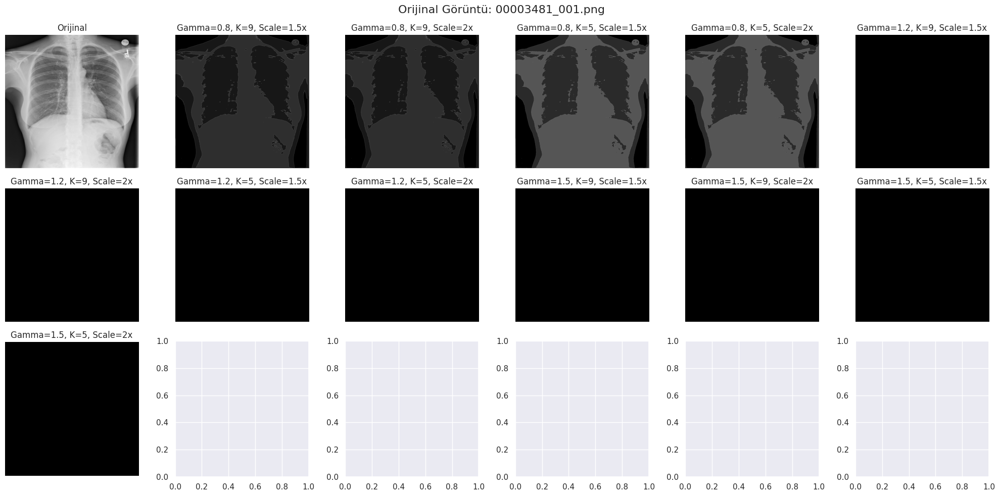

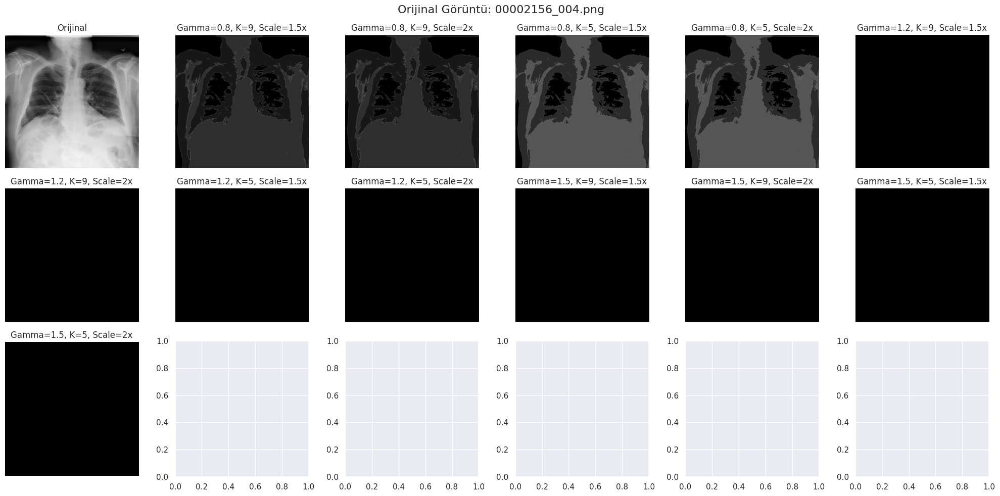

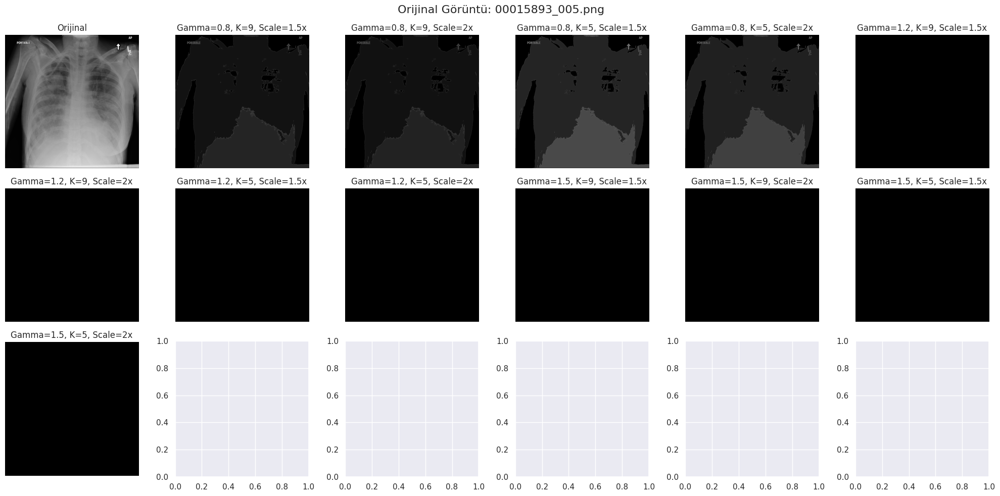

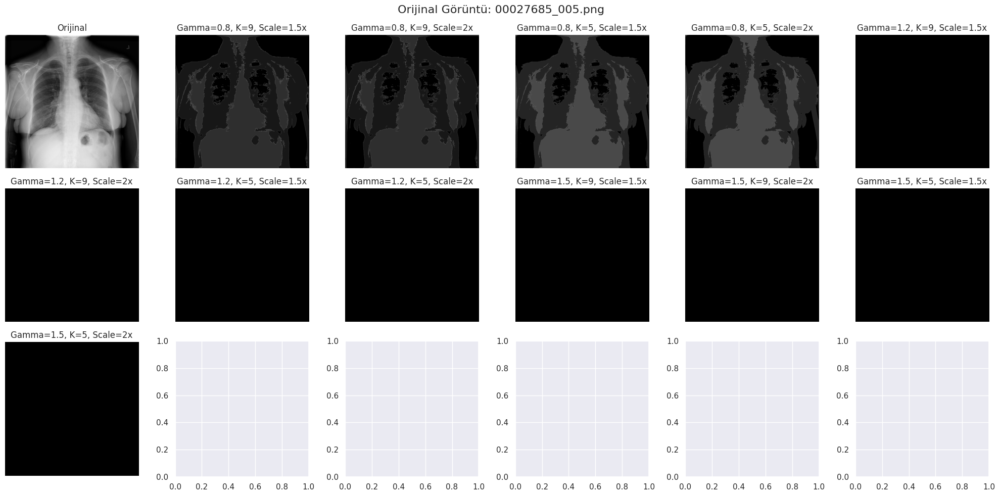

In [22]:
# Rastgele 4 görüntü seçelim
images = train_df['Image'].values
random_images = [np.random.choice(images) for i in range(4)]
print("Seçilen rastgele görüntüler:", random_images)

# Hiperparametreler
gamma_values = [0.8, 1.2, 1.5]
sharpening_kernels = [
    np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]]),
    np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
]
scale_factors = [1.5, 2]

# Toplam kombinasyon sayısını hesapla
num_combinations = len(gamma_values) * len(sharpening_kernels) * len(scale_factors)

# Her görüntü için ayrı bir figür oluştur
for idx, img_name in enumerate(random_images):
    img_path = os.path.join(img_dir, img_name)
    raw_image = plt.imread(img_path)

    # Her orijinal görüntü için yeni bir figür oluştur
    fig, axes = plt.subplots(3, 6, figsize=(20, 10))
    fig.suptitle(f"Orijinal Görüntü: {img_name}", fontsize=16)

    # Orijinal görüntüyü göster
    axes[0, 0].imshow(raw_image, cmap='gray')
    axes[0, 0].set_title("Orijinal")
    axes[0, 0].axis('off')

    plot_idx = 1
    for gamma in gamma_values:
        gamma_corrected = np.power(raw_image / 255.0, gamma) * 255
        gamma_corrected = gamma_corrected.astype(np.uint8)

        for kernel in sharpening_kernels:
            sharpened_image = np.clip(cv2.filter2D(gamma_corrected, -1, kernel), 0, 255).astype(np.uint8)

            for scale in scale_factors:
                resized_image = zoom(sharpened_image, scale, order=3)

                # Sonraki subplot'a yerleştir
                row = plot_idx // 6
                col = plot_idx % 6
                axes[row, col].imshow(resized_image, cmap='gray')
                axes[row, col].set_title(f"Gamma={gamma}, K={kernel[1,1]}, Scale={scale}x")
                axes[row, col].axis('off')
                plot_idx += 1

    plt.tight_layout()
    plt.show()

Gamma Düzeltme Problemi:

gamma_corrected işlemi sonrasında bazı görüntülerin tamamen siyah görünmesi, gamma düzeltme katsayısının yanlış uygulanmasından kaynaklanabilir. Özellikle, gamma değeri 1'den büyük olduğunda, görüntünün kontrastı aşırı düzeyde artırılmış olabilir, bu da siyah ekranlara neden olur.
Ayrıca, np.power fonksiyonunun çıkış değerleri normalize edilmediği için piksel değerleri 0-255 aralığından çıkabilir.
Keskinleştirme (Unsharp Masking) Problemi:

Kernel filtreleme işlemi sırasında, özellikle yüksek keskinlik değerleri içeren kernel kullanıldığında, görüntü kayıpları yaşanabilir. Bu durum, görüntülerin tamamen siyah olmasına veya bozulmasına yol açabilir.
Keskinleştirme sonrası elde edilen görüntülerin negatif veya çok yüksek değerlere sahip olması sonucu görüntüler tamamen siyah hale gelebilir.
Interpolation ve Zoom İşlemi Problemi:

zoom() fonksiyonuyla yapılan bicubic enterpolasyon sırasında, görüntü boyutu veya veri türü uyumsuzluğu yaşanabilir. Özellikle, order=3 ile yapılan büyütme işlemi bazı durumlarda orijinal görüntüde hatalara neden olabilir.

Gamma düzeltmesi sonrası, görüntüleri normalize edin. Bu, piksel değerlerinin 0-255 aralığında kalmasını sağlayacaktır:

gamma_corrected = np.power(raw_image / 255.0, gamma) * 255

gamma_corrected = cv2.normalize(gamma_corrected, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)


Keskinleştirme işlemi sonrası elde edilen görüntüleri, 0-255 aralığına sıkıştırılım

sharpened_image = np.clip(cv2.filter2D(gamma_corrected, -1, kernel), 0, 255).astype(np.uint8)


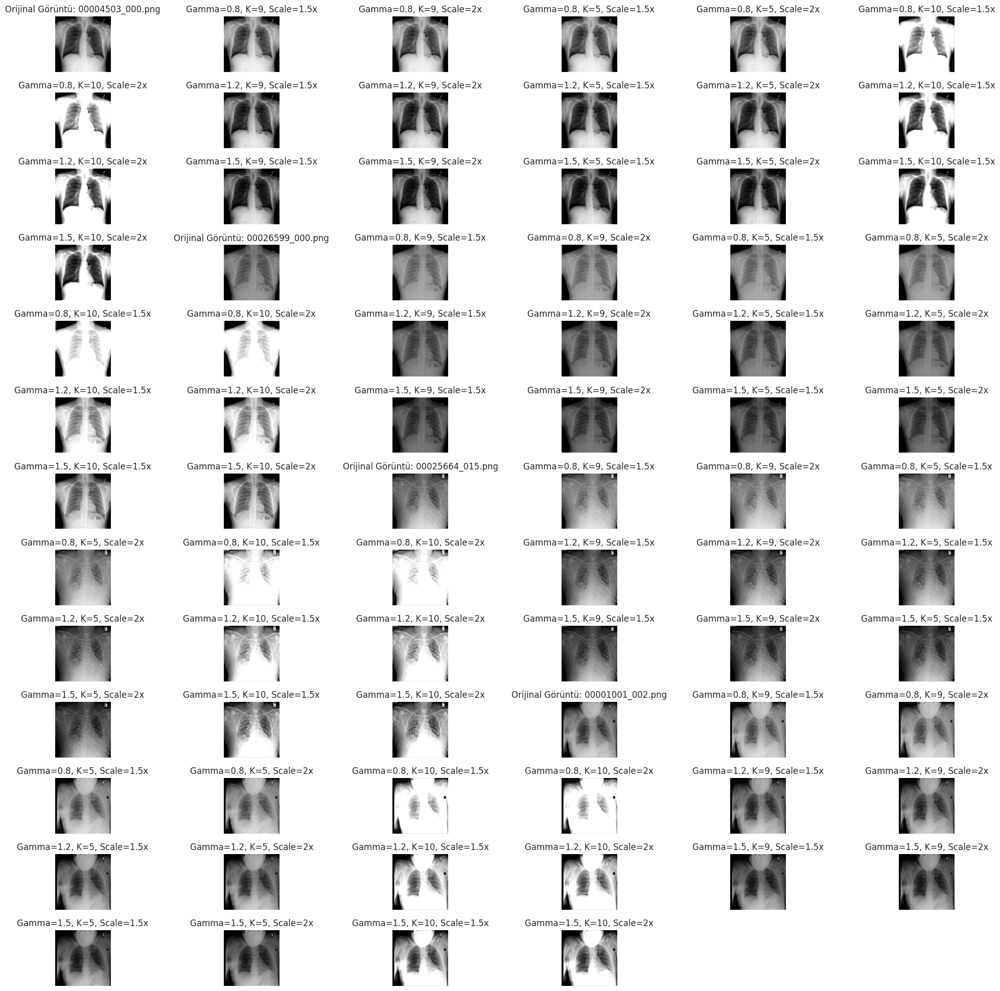

In [24]:
# 4 rastgele görüntü seçelim
images = train_df['Image'].values
random_images = [np.random.choice(images) for i in range(4)]

# Hiperparametreler
gamma_values = [0.8, 1.2, 1.5]  # Farklı gamma düzeltme katsayıları
sharpening_kernels = [
    np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]]),
    np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]]),
    np.array([[-1, -1, -1], [-1, 10, -1], [-1, -1, -1]])
]
scale_factors = [1.5, 2]  # Büyütme ölçekleri

# Görselleştirme ayarları
plt.figure(figsize=(20, 30))
plot_idx = 1

# 4 rastgele seçilmiş görüntü üzerinde deneme yapalım
for idx, img_name in enumerate(random_images):
    img_path = os.path.join(img_dir, img_name)
    raw_image = plt.imread(img_path)

    # Orijinal görüntüyü normalize edelim
    min_val, max_val = raw_image.min(), raw_image.max()
    raw_image = ((raw_image - min_val) / (max_val - min_val) * 255).astype(np.uint8)

    # Orijinal görüntüyü göster
    plt.subplot(4 * (len(gamma_values) * len(sharpening_kernels) * len(scale_factors) // 6 + 2), 6, plot_idx)
    plt.imshow(raw_image, cmap='gray')
    plt.title(f"Orijinal Görüntü: {img_name}")
    plt.axis('off')
    plot_idx += 1

    # İşlenmiş görüntüler için kombinasyonları göster
    for gamma in gamma_values:
        gamma_corrected = np.power(raw_image / 255.0, gamma) * 255
        gamma_corrected = gamma_corrected.astype(np.uint8)

        for kernel in sharpening_kernels:
            sharpened_image = np.clip(cv2.filter2D(gamma_corrected, -1, kernel), 0, 255).astype(np.uint8)

            for scale in scale_factors:
                resized_image = zoom(sharpened_image, scale, order=3)

                plt.subplot(4 * (len(gamma_values) * len(sharpening_kernels) * len(scale_factors) // 6 + 2), 6, plot_idx)
                plt.imshow(resized_image, cmap='gray')
                plt.title(f"Gamma={gamma}, K={kernel[1,1]}, Scale={scale}x")
                plt.axis('off')
                plot_idx += 1

plt.tight_layout()
plt.show()

**Görüntü: 00004503_000.png**

**Gamma Düzeltmesi (Gamma=0.8, 1.2, 1.5):**

Düşük gamma değerleri (0.8) daha fazla kontrast ekleyerek görüntünün daha koyu alanlarını belirginleştirmiş. Özellikle akciğer alanları daha koyu tonlara sahip.
**Yüksek gamma değerleri (1.5)**
 parlak alanları artırarak kontrastı düşürmüş ve görüntüyü daha açık tonlarda göstermiş.

**Keskinleştirme (K=9, 5, 10):**

Keskinleştirme kernel değerlerine göre detaylar belirginleştirilmiş. K=10 ile yapılan keskinleştirme, kaburgalar ve damar yapılarında daha net detaylar sunmuş.

**Enterpolasyon (Scale=1.5x, 2x):**

Enterpolasyonla büyütme işlemi, görüntü detaylarını biraz daha ortaya çıkarmış ancak bazı durumlarda aşırı parlaklık veya bulanıklık görülebiliyor.

**Görüntü: 00026599_000.png**

**Gamma Düzeltmesi:**

Düşük gamma (0.8) akciğer içi detayları artırmış ancak genel kontrastı yükseltmiş.
Yüksek gamma (1.2 ve 1.5) daha aydınlık bir görünüm sunmuş, ancak detayların bazıları kaybolmuş.

**Keskinleştirme:**

K=5 ve K=9 değerleri, özellikle damar yapılarının netliğini artırırken K=10, aşırı keskinleştirme nedeniyle hafif bozulmalara yol açmış.
Büyütme:
Ölçeklendirme ile yapılan enterpolasyon, daha fazla ayrıntıyı görünür hale getirmiş ancak bazı görüntülerde bulanıklık gözlemlenmiş.

**Görüntü: 00025664_015.png**

**Gamma ve Keskinleştirme Kombinasyonları:**

Düşük gamma ve yüksek keskinleştirme (K=10) detayları vurgulamış ancak bazı bölgelerde aşırı parlaklık oluşturmuş.
Yüksek gamma ve düşük keskinleştirme (K=5), görüntünün daha dengeli ve net görünmesini sağlamış.
Büyütme:
Enterpolasyon ile büyütme işlemi, özellikle ince damar yapılarının daha iyi görünmesine yardımcı olmuş.

**Görüntü: 00001001_002.png**

**Gamma Düzeltmesi:**

Orta seviyede gamma (1.2) ayarı, görüntüdeki kontrastı optimize etmiş.

**Keskinleştirme:**

K=9 ve K=10 ile yapılan keskinleştirmeler, özellikle akciğer alanındaki detayları öne çıkarmış.

**Büyütme:**

2x büyütme ile yapılan enterpolasyon, bazı detayları daha netleştirmiş ancak görüntünün genel kalitesini olumsuz etkilememiş.
